In [333]:
import pandas as pd
import numpy as np
import folium
import haversine as hs
from  itertools import combinations
from collections import Counter

import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering, KMeans

from yellowbrick.cluster import KElbowVisualizer
from ortools.constraint_solver import routing_enums_pb2
from ortools.constraint_solver import pywrapcp
from openrouteservice import client, places, distance_matrix, directions

import warnings
warnings.filterwarnings('ignore')

In [156]:
COLORS =  ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

In [242]:
COLOR_DICT, counter = {}, 0
for c in COLORS:
    if c not in COLOR_DICT:
        COLOR_DICT[counter] = c
        counter+=1

In [3]:
df = pd.read_csv('routes_data.csv', parse_dates=[1,2])

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15318 entries, 0 to 15317
Data columns (total 6 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Unnamed: 0                  15318 non-null  int64         
 1   ReportTimeSlotDateTimeFrom  15318 non-null  datetime64[ns]
 2   ReportTimeSlotDateTimeTo    15318 non-null  datetime64[ns]
 3   latitude                    15318 non-null  float64       
 4   longitude                   15318 non-null  float64       
 5   tasks.route_sheet_number    15318 non-null  int64         
dtypes: datetime64[ns](2), float64(2), int64(2)
memory usage: 718.2 KB


In [6]:
len(df['tasks.route_sheet_number'].unique())

4149

In [7]:
df=df.drop('Unnamed: 0', axis=1)

In [8]:
df.columns=['time_from', 'time_to', 'lat', 'lon', 'route']

In [10]:
a=pd.DataFrame(df['route'].value_counts().sort_values()[383:])
more_than_one=df.merge(a, how='inner', right_on=a.index, left_on=df.route)

### Часть 1

In [11]:
all_orders = df[['lat', 'lon']].values.tolist()
map = folium.Map(zoom_start=4)
for coordinates in all_orders:
    folium.vector_layers.CircleMarker(location=coordinates, radius=2,color = 'red').add_to(map)
    
folium.vector_layers.Marker(location=[55.669210, 37.556877], radius=2).add_to(map)
map

В датасете есть координаты за пределами Москвы, которые нужно будет удалить

In [14]:
(df.time_to-df.time_from).sort_values()[-1:]

7658   01:00:00
dtype: timedelta64[ns]

In [15]:
r19 = df[((df.time_from>'2021-06-18')&(df.time_from<'2021-06-20'))]

In [19]:
(df.groupby('route')['time_from'].max()-df.groupby('route')['time_to'].min()).sort_values(ascending=False)[:20]

route
1166880   1 days 06:00:00
1185171   1 days 00:20:00
1175047   1 days 00:00:00
1166546   0 days 22:40:00
1187437   0 days 20:40:00
1179246   0 days 20:00:00
1178886   0 days 18:40:00
1174547   0 days 18:00:00
1189689   0 days 17:00:01
1190327   0 days 16:00:00
1187479   0 days 15:20:00
1166724   0 days 15:00:00
1158557   0 days 14:40:00
1185182   0 days 14:40:00
1172855   0 days 13:40:00
1178625   0 days 13:20:00
1168843   0 days 13:20:00
1169556   0 days 12:20:00
1169988   0 days 12:00:00
1176902   0 days 12:00:00
dtype: timedelta64[ns]

In [20]:
df[df.route==1166880]

,time_from,time_to,lat,lon,route
4112,2021-06-21 14:00:00,2021-06-21 14:20:00,55.774082,37.468758,1166880
4226,2021-06-21 14:40:00,2021-06-21 15:40:00,55.781340,37.481377,1166880
4240,2021-06-21 14:40:00,2021-06-21 15:40:00,55.782246,37.478670,1166880
4279,2021-06-21 15:00:00,2021-06-21 16:00:00,55.784290,37.471870,1166880
7195,2021-06-22 20:20:00,2021-06-22 21:20:00,55.776566,37.462180,1166880


Некоторые маршруты содержат заказы со слишком большой разницей в необходимом врмени доставки (от нескольких часов до дня), что скорее всего тоже является ошибкой

In [140]:
r19=df[(df.time_from>='2021-06-18')&(df.time_from<'2021-06-20')]
r19.lat.value_counts()

55.785164    18
55.777560    15
55.806717    13
55.753838    13
55.806114    13
             ..
55.731083     1
55.804916     1
55.762444     1
55.761410     1
55.741320     1
Name: lat, Length: 1167, dtype: int64

In [136]:
r19[r19.lat==55.785164]

,time_from,time_to,lat,lon,route
379,2021-06-19 11:40:00,2021-06-19 12:40:00,55.785164,37.53337,1157224
406,2021-06-19 12:00:00,2021-06-19 12:20:00,55.785164,37.53337,1157435
522,2021-06-19 12:40:00,2021-06-19 13:40:00,55.785164,37.53337,1157512
612,2021-06-19 13:20:00,2021-06-19 14:20:00,55.785164,37.53337,1157803
689,2021-06-19 14:00:00,2021-06-19 14:20:00,55.785164,37.53337,1158036
793,2021-06-19 15:00:00,2021-06-19 16:00:00,55.785164,37.53337,1158356
817,2021-06-19 15:00:00,2021-06-19 16:00:00,55.785164,37.53337,1158361
928,2021-06-19 16:00:00,2021-06-19 17:00:00,55.785164,37.53337,1158587
1007,2021-06-19 16:40:00,2021-06-19 17:40:00,55.785164,37.53337,1158693
1148,2021-06-19 18:00:00,2021-06-19 18:20:00,55.785164,37.53337,1159139


Если заказы на один адрес делались в одно время на разные временные окна (возможно это странно), то на пересекающиеся окна можно было поставить одного курьера     
+алгоритм кластеризации сгруппировал бы один адрес в один кластер (маршрут)
       
Если заказы по одному адресу делались последовательно в течение дня, то скорее всего курьера отправляют практически сразу после оформления заказа, поэтому формировать маршруты нужно сгруппировав исторические данные хотябы по часу (чтобы симулировать/смоделировать динамическое формирование машрутов).

Для примера возьмем все маршруты, содержащие вечерние заказы (в слот 21:00) и проверим, можно ли улучшить качетсво группировки точек

In [263]:
night_routes = pd.DataFrame(df[df.time_from=='2021-06-19 21:00:00']['route'])
night_orders = df.merge(night_routes, how='inner', left_on='route', right_on='route').drop_duplicates()
print('Минимальное время заказа:', night_orders.time_from.min())
print('Максимальное время заказа:', night_orders.time_from.max())
print('Число маршрутов:', len(night_orders.route.unique()))

Минимальное время заказа: 2021-06-19 20:20:00
Максимальное время заказа: 2021-06-19 22:00:00
Число маршрутов: 34


In [264]:
c = pd.DataFrame(night_orders.route.value_counts())
c['color'] = np.vstack([np.arange(18).reshape(-1, 1), np.array([18]*(34-18)).reshape(-1, 1)])

In [265]:
night_orders=night_orders.merge(c['color'], left_on='route', right_on=c.index)

In [393]:
total_diff, route_means = [], []
for r in night_orders.route.unique():
    route=night_orders[night_orders.route==r][['lat', 'lon']].values.tolist()
    all_combinations = []
    for i in range(len(route)):
        for c in list(combinations(route,2)):
            all_combinations.append(hs.haversine(c[0], c[1]))
    route_means.append(np.array([i for i in all_combinations if i != 0]).mean())
    
route_means=[i for i in route_means if str(i) != 'nan']

print('Среднее расстояние:', round(np.array(route_means).mean(), 2), 'км')
print('Число маршрутов:', len(night_orders.route.unique()))
print('Среднее число заказов в маршруте:', round(len(night_orders) / len(night_orders.route.unique()), 3))

Среднее расстояние: 1.84 км
Число маршрутов: 34
Среднее число заказов в маршруте: 3.235


In [260]:
map = folium.Map(tiles='Stamen Toner', location=[55.832386, 37.469330], zoom_start = 11)

colors = []
for i in night_orders['color']:
    colors.append(COLOR_DICT[i])

route=night_orders[['lat', 'lon']].values.tolist()
for coordinates, color in zip(route, colors):
    folium.vector_layers.CircleMarker(location=coordinates, radius=2, color=color).add_to(map)

map

#### Кластеризация

In [ ]:
train_data = night_orders[['lat', 'lon']]
scaler=StandardScaler().fit(train_data)
train_data = scaler.transform(train_data)

Число кластеров можно определить используя метод локтя при KMeans и Silhouette Score

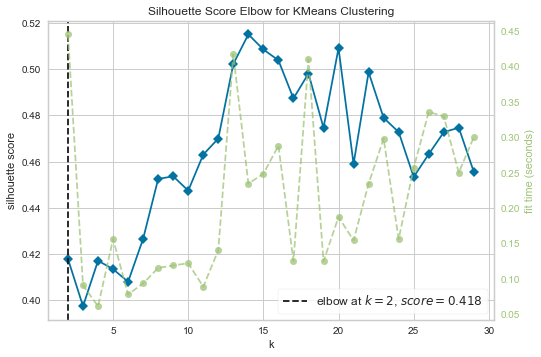

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [314]:
# Silhouette Score для иерархической кластеризации
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2,30),metric='silhouette', timings= True)
visualizer.fit(train_data)       
visualizer.show()       

Чтобы курьеры успевади во врменные окна лучше выбрать число кластеров больше 15. Значение Silhouette Score и скорости обучения достаточно высоки при 18 кластерах

In [ ]:
model = AgglomerativeClustering(n_clusters=18, linkage='ward')
model.fit(train_data)

In [ ]:
colors = []
for i in model.labels_:
    colors.append(COLOR_DICT[i])

In [296]:
map = folium.Map(tiles='Stamen Toner', location=[55.669210, 37.556877], zoom_start = 10)
route=night_orders[['lat', 'lon']].values.tolist()
    
for coordinates, color in zip(route, colors):
    folium.vector_layers.CircleMarker(location=coordinates, radius=2, color=color).add_to(map)
map

In [304]:
night_orders['cluster'] = model.labels_

In [394]:
total_diff, cluster_means = [], []
for c in night_orders.cluster.unique()[:2]:
    cluster=night_orders[night_orders.cluster==c][['lat', 'lon']].values.tolist()
    all_combinations = []
    for i in range(len(cluster)):
        for c in list(combinations(cluster,2)):
            all_combinations.append(hs.haversine(c[0], c[1]))
    cluster_means.append(np.array([i for i in all_combinations if i != 0]).mean())
    

print('Среднее расстояние:', round(np.array(cluster_means).mean(), 2), 'км')
print('Число маршрутов:', len(night_orders.cluster.unique()))
print('Среднее число заказов в маршруте:', round(len(night_orders) / len(night_orders.cluster.unique()), 3))

Среднее расстояние: 0.92 км
Число маршрутов: 18
Среднее число заказов в маршруте: 6.111


Среднее расстояние и число маршрутов уменьшились. (Предполагется, что если расстояние сократилось, то курьеры будут успевать в тайм слоты)

### Задание 2

Предложить алгоритм, который расставит точки на маршруте в вероятном порядке следования курьера по маршруту.

In [18]:
x=list(c['lat'].values), list(c['lon'].values)

coords=[[37.556877, 55.669210]]
for i, j in zip(x,y):
    coords.append([j, i])

In [20]:
api_key = '5b3ce3597851110001cf6248b7139db401934c05a8d88381fc9da130'
clnt = client.Client(key=api_key)

request = {'locations': coords,
           'profile': 'driving-car',
           'metrics': ['duration']}
    
clients_matrix = clnt.distance_matrix(**request)['durations']

In [21]:
a=[]
for i in clients_matrix:
    a.append([int(x/60) for x in i])

In [26]:
time_windows = [(0, 300), (0, 60), (60, 120), (60, 120), (60, 120), (60, 120), (60, 120), (120, 180), (120, 180), (120, 180), (120, 180), (120, 180)]

In [105]:
%%timeit -n 1 -r 1
#  --------Решение задачи маршрутизации------

def create_data_model():
    data = {}
    data['time_matrix'] = a
    data['time_windows'] = time_windows
    data['num_vehicles'] = 1
    data['depot'] = 0
    return data


def print_solution(data, manager, routing, solution):
    time_dimension = routing.GetDimensionOrDie('Time')
    total_time = 0
    for vehicle_id in range(data['num_vehicles']):
        index = routing.Start(vehicle_id)
        plan_output = 'Route for vehicle {}:\n'.format(vehicle_id)
        while not routing.IsEnd(index):
            time_var = time_dimension.CumulVar(index)
            plan_output += '{0} Time({1},{2}) -> '.format(
                manager.IndexToNode(index), solution.Min(time_var),
                solution.Max(time_var))
            index = solution.Value(routing.NextVar(index))
            
        time_var = time_dimension.CumulVar(index)
        plan_output += '{0} Time({1},{2})\n'.format(manager.IndexToNode(index),
                                                    solution.Min(time_var),
                                                    solution.Max(time_var))
        plan_output += 'Time of the route: {}min\n'.format(
            solution.Min(time_var))
        print(plan_output)
        total_time += solution.Min(time_var)




data = create_data_model()


manager = pywrapcp.RoutingIndexManager(len(data['time_matrix']),
                                       data['num_vehicles'], data['depot'])


routing = pywrapcp.RoutingModel(manager)

def time_callback(from_index, to_index):
    from_node = manager.IndexToNode(from_index)
    to_node = manager.IndexToNode(to_index)
    return data['time_matrix'][from_node][to_node]

def save_optimal(coords, routing, solution):
    optimal_coords=[]
    index = routing.Start(0)
    while not routing.IsEnd(index):
        optimal_coords.append(coords[index])
        index = solution.Value(routing.NextVar(index))
    return optimal_coords

transit_callback_index = routing.RegisterTransitCallback(time_callback)


routing.SetArcCostEvaluatorOfAllVehicles(transit_callback_index)


time = 'Time'
routing.AddDimension(
    transit_callback_index,
    300,  # allow waiting time
    300,  # maximum time per vehicle
    False,  # Don't force start cumul to zero.
    time)
time_dimension = routing.GetDimensionOrDie(time)

for location_idx, time_window in enumerate(data['time_windows']):
    if location_idx == data['depot']:
        continue
    index = manager.NodeToIndex(location_idx)
    time_dimension.CumulVar(index).SetRange(time_window[0], time_window[1])

depot_idx = data['depot']
for vehicle_id in range(data['num_vehicles']):
    index = routing.Start(vehicle_id)
    time_dimension.CumulVar(index).SetRange(
                data['time_windows'][depot_idx][0],
                data['time_windows'][depot_idx][1])

        
for i in range(data['num_vehicles']):
    routing.AddVariableMinimizedByFinalizer(
            time_dimension.CumulVar(routing.Start(i)))
    routing.AddVariableMinimizedByFinalizer(
            time_dimension.CumulVar(routing.End(i)))

search_parameters = pywrapcp.DefaultRoutingSearchParameters()
search_parameters.first_solution_strategy = (
    routing_enums_pb2.FirstSolutionStrategy.PATH_CHEAPEST_ARC)


solution = routing.SolveWithParameters(search_parameters)

            
if solution:
    print_solution(data, manager, routing, solution)
    optimal_coords = save_optimal(coords, routing, solution)
    
#  ------Визуализация-----    
m = folium.Map(tiles='Stamen Toner',location=[55.669210, 37.556877], zoom_start=14)

request = {'coordinates': optimal_coords,
           'profile': 'driving-car',
           'geometry': 'true',
           'format_out': 'geojson',       
          }

optimal_route = clnt.directions(**request)
folium.features.GeoJson(data=optimal_route,
                        name='Optimal Bar Crawl',
                       overlay=True).add_to(m)
print(optimal_coords)
m

Route for vehicle 0:
0 Time(0,0) -> 1 Time(22,60) -> 4 Time(60,87) -> 5 Time(75,102) -> 3 Time(78,105) -> 2 Time(79,106) -> 6 Time(83,110) -> 10 Time(120,120) -> 11 Time(126,126) -> 8 Time(128,128) -> 7 Time(131,131) -> 9 Time(138,138) -> 0 Time(158,158)
Time of the route: 158min

[[37.556877, 55.66921], [37.65347, 55.7521], [37.651695000000004, 55.75716], [37.534447, 55.749990000000004], [37.547886, 55.758286], [37.5598, 55.757194999999996], [37.580086, 55.772186], [37.622955, 55.774876], [37.647762, 55.77398], [37.648945, 55.771614], [37.655376000000004, 55.75173], [37.62631, 55.755984999999995]]
9.33 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


In [106]:
optimal_coords=[[37.556877, 55.66921], [37.65347, 55.7521], [37.651695000000004, 55.75716], [37.534447, 55.749990000000004], [37.547886, 55.758286], [37.5598, 55.757194999999996], [37.580086, 55.772186], [37.622955, 55.774876], [37.647762, 55.77398], [37.648945, 55.771614], [37.655376000000004, 55.75173], [37.62631, 55.755984999999995]]

In [117]:
m = folium.Map(tiles='Stamen Toner',location=[55.669210, 37.556877], zoom_start=10)
coords=[[y, x] for [x, y] in coords]
request = {'coordinates': optimal_coords,
           'profile': 'driving-car',
           'geometry': 'true',
           'format_out': 'geojson',       
          }

optimal_route = clnt.directions(**request)
folium.features.GeoJson(data=optimal_route,
                        name='Optimal Bar Crawl',
                       overlay=True).add_to(m)

for coordinates in coords:
    folium.vector_layers.CircleMarker(location=coordinates, radius=2, color='green').add_to(m)

m